<font  size=6>  Проект "Рынок общественного питания Москвы"

Предлагаемый к анализу датасет состоит из информации по заведениям общественного питания Москвы. В нем содержатся ключевые показатели объектов общепита - название, координаты, число посадочных мест, средний чек и др.

Задание - произвести исследовательский анализ данных, выявить закономерности в данных, построить необходимые визуализации, а также составить презентацию для заказчика исследования о целосообразности открытия кафе.

<div class="alert alert-block alert-warning">📝
    

__Комментарий от ревьюера №1__


Отличная практика - расписывать цель и основные этапы своими словами (этот навык очень поможет на фильнальном проекте). Хорошо было бы добавить ход и цель исследования. Вот мой личный пример из 3 проекта: 
    
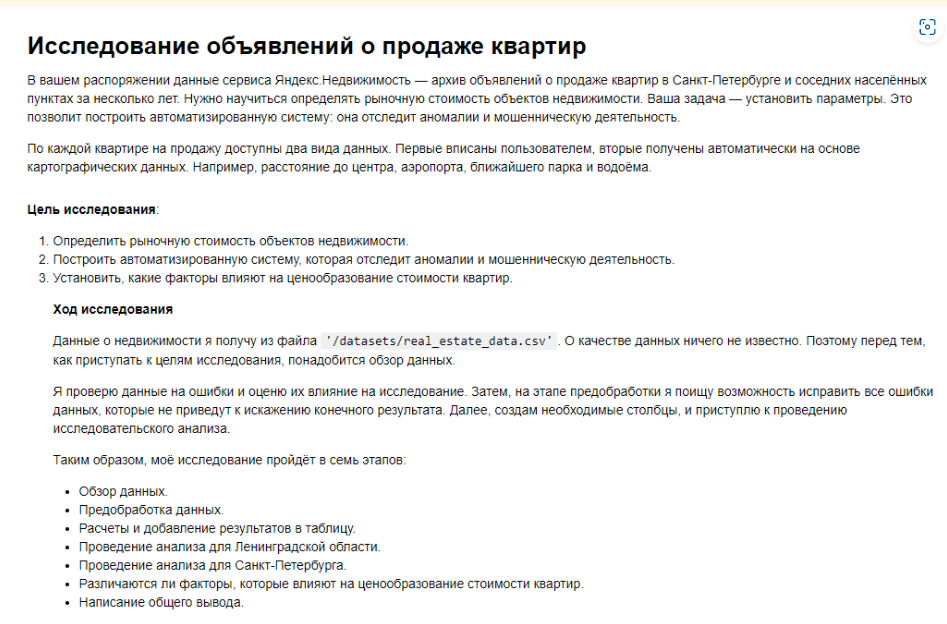
</div>

### Обзор и предобрабтка данных

Импортируем необходимые библиотеки, сохраним данные в переменной и выведем ключевые параметры датафрейма.

#### Обзор данных

In [1]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
from IPython.display import display
import plotly.express as px
from plotly import graph_objects as go
import warnings; warnings.filterwarnings(action='ignore')

In [2]:
import folium
from folium import Map, Marker
from folium.plugins import MarkerCluster
from folium import Map, Choropleth

In [3]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [6]:
display(data['category'].unique())

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Датафрейм состоит из 14 столбцов, как говорилось в описании проекта. Пропусков довольно много.

In [7]:
display(data['name'].value_counts())

Кафе                  189
Шоколадница           120
Домино'с Пицца         76
Додо Пицца             74
One Price Coffee       71
                     ... 
Sreда                   1
Фа Минор                1
Закарпатские узоры      1
Пиццы захотелось        1
Тим Шашлык&Бургер       1
Name: name, Length: 5614, dtype: int64

В списке сгруппированных по названию заведений лидируют места с нехитрым названием "Кафе"

In [8]:
display(data['name'].nunique())

5614

In [9]:
data['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [10]:
data.duplicated().sum()

0

Полных дубликтов нет. Приступим к добавлению столбцов, как сказано в задании

#### Добавление столбцов

In [11]:
# Создадим функцию для извлечения названия улицы, которая извлекает вторую позицию из адреса.
# В подавляющем числе случаев - это и будет название улицы. Исключения игнорируем.
def extract_street(row):
    address = row['address'].split(', ')
    street = address[1]
    return street

data['street'] = data.apply(extract_street, axis=1)

display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Здорово, что используешь регулярные выражения
</div>

In [12]:
#Добавим столбец, который отражает, круглосуточное заведение или нет
data['is_24/7'] = data[data['hours'].apply(lambda x: 'ежедневно, круглосуточно' in str(x))]['hours'] == 'ежедневно, круглосуточно'
data['is_24/7'] = data['is_24/7'].fillna(False)
data['is_24/7'].value_counts()

False    7676
True      730
Name: is_24/7, dtype: int64

#### Обработка пропусков

In [13]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
street                  0
is_24/7                 0
dtype: int64

Заполнение пропусков без искажения данных не представляется возможным. Далее будет работать с теми данными, которые у нас есть, не добавляя ничего от себя. Наличие пропусков не должно сказаться на дальнейшем анализе.

<div class="alert alert-block alert-danger">✍
    

__Комментарий от ревьюера №1__

Важным пунктом на этом этапе является проверка "неявных" дубликатов. Неявные дубликаты могут появиться в случаях, когда данные собирались из разных источников или в системе были какие-то сбои при логировании.

Проверку на такие дубликаты можно сделать с помощью https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.duplicated.html, передав в параметр subset список названий колонок.
    
---
    
Но есть один нюанс. Если мы приведем названия заведения к единой форме, то увидим интересные результаты
</div>

<div class="alert alert-info"> <b>Комментарии студента:</b> Добавил раздел, где работаю с неявными дубликатами </div>

#### Обработка неявных дубликатов

Допустим, в датасете действительно присутствуют неявные дубликаты. В таком случае, координаты этих заведений должны совпадать. Проведем проверку.

In [14]:
duplicated_coords = data[data.duplicated(subset=['lat', 'lng']) == True]

In [15]:
duplicated_coords

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
182,Карелия,кафе,"Москва, Карельский бульвар, 4А",Северный административный округ,"ежедневно, 09:00–00:00",55.891936,37.536068,3.7,NaN,NaN,NaN,NaN,0,NaN,Карельский бульвар,False
273,Pho Oanh,кафе,"Москва, Староватутинский проезд, 14",Северо-Восточный административный округ,"ежедневно, 11:00–21:30",55.875804,37.665551,4.0,NaN,NaN,NaN,NaN,1,100.0,Староватутинский проезд,False
662,Family Cafe Mayak,ресторан,"Москва, Головинское шоссе, 10Б",Северный административный округ,"ежедневно, 10:00–22:00",55.837181,37.497324,4.7,NaN,NaN,NaN,NaN,0,NaN,Головинское шоссе,False
1074,Халяль Кафе-Пекарня,булочная,"Москва, Анадырский проезд, 8, корп. 1",Северо-Восточный административный округ,"ежедневно, 08:00–21:00",55.863555,37.682835,3.7,NaN,Средний счёт:300–700 ₽,500.0,NaN,0,100.0,Анадырский проезд,False
1452,Сикварули,ресторан,"Москва, улица Куусинена, 11, корп. 2",Северный административный округ,"ежедневно, 10:00–22:00",55.782729,37.513952,4.4,NaN,NaN,NaN,NaN,1,10.0,улица Куусинена,False
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,Волоколамское шоссе,False
2007,Лепим и Варим,кафе,"Москва, Лесная улица, 20, стр. 3",Центральный административный округ,"ежедневно, 10:00–23:00",55.780218,37.593084,4.4,средние,Средний счёт:400–800 ₽,600.0,NaN,1,500.0,Лесная улица,False
2841,Чайхана Döner,кафе,"Москва, Измайловский проспект, 61с2",Восточный административный округ,"ежедневно, круглосуточно",55.788610,37.783970,4.0,NaN,NaN,NaN,NaN,0,NaN,Измайловский проспект,True
2866,Dragon Mixology Bar,кафе,"Москва, Щёлковское шоссе, вл75",Восточный административный округ,"ежедневно, 10:00–22:00",55.810949,37.799413,3.8,NaN,NaN,NaN,NaN,0,NaN,Щёлковское шоссе,False
2974,Позы&Буузы,кафе,"Москва, Хабаровская улица, 15",Восточный административный округ,"пн-чт 11:00–22:00; пт 11:00–23:00; сб,вс 11:00...",55.822498,37.823358,4.3,NaN,NaN,NaN,NaN,0,75.0,Хабаровская улица,False


In [16]:
#Проанализируем первую позицию
print(data[data['lat'] == 55.891936])

        name category                         address  \
121  Встреча     кафе  Москва, Карельский бульвар, 4А   
182  Карелия     кафе  Москва, Карельский бульвар, 4А   

                            district                     hours        lat  \
121  Северный административный округ  ежедневно, круглосуточно  55.891936   
182  Северный административный округ    ежедневно, 09:00–00:00  55.891936   

           lng  rating price avg_bill  middle_avg_bill  middle_coffee_cup  \
121  37.536068     4.1   NaN      NaN              NaN                NaN   
182  37.536068     3.7   NaN      NaN              NaN                NaN   

     chain  seats              street  is_24/7  
121      1    NaN  Карельский бульвар     True  
182      0    NaN  Карельский бульвар    False  


По первой позиции видно, что так анализировать одни только координаты не получится.
Потому что непонятно, то ли это одно заведение закрылось, а второе открылось на его месте, то ли это два разных заведения по одному адресу.

In [17]:
data['name'].value_counts()

Кафе                  189
Шоколадница           120
Домино'с Пицца         76
Додо Пицца             74
One Price Coffee       71
                     ... 
Sreда                   1
Фа Минор                1
Закарпатские узоры      1
Пиццы захотелось        1
Тим Шашлык&Бургер       1
Name: name, Length: 5614, dtype: int64

In [18]:
#Приведем к нижнему регистру и удалим крайние пробелы
data['name'] = data['name'].str.lower()
data['name'] = data['name'].str.strip()
data['name'].value_counts()

кафе                  189
шоколадница           120
домино'с пицца         77
додо пицца             74
one price coffee       72
                     ... 
уйгурский лагман        1
pho 73                  1
столовая докки № 9      1
лето близко             1
мини маман              1
Name: name, Length: 5512, dtype: int64

In [19]:
duplicates = data[data.duplicated(subset=['name', 'lat', 'lng']) == True]
duplicates

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,Волоколамское шоссе,False


In [20]:
# посмотрим список названий заведений
import sys
np.set_printoptions(threshold=sys.maxsize)
name_list = data['name'].sort_values().unique()
print(name_list)

['#кешбэккафе' '+39 pizzeria mozzarella bar' '1 этаж' '1-я креветочная'
 '10 идеальных пицц' '1001 ночь' '100ловая' '100лоффка' '13'
 '13 chef doner' '15 kitchen+bar' '15-й шар' '16 июня' '16 тонн'
 '18 грамм' '1901 comfort food zone' '1у' '2 типа' '2-й этаж' '2046'
 '21 век' '22 акра кофе&хлеб' '2u-ту-ю' '3 ступени' '351 bar' '4 сезона'
 '4.2. bar' '4/1 restaurant' '42 coffee shop' '47' '495' '4friends coffee'
 '4tuna cafe&grill' '5 stars coffee' '55.709201, 37.392257'
 '6 am bread kitchen' '6 рукопожатий' '69 раков' '7 сэндвичей' '7 элемент'
 '7/12' '8 oz' '8 вафель' '8 зёрен' '8 пончиков'
 '800°с contemporary steak' '8bit pizza' '9 bar coffe' '9 bar coffee'
 '9 зёрен' 'a-cafe' 'abc coffee roasters' 'acai family' 'accent'
 "adam's chicken" 'adria mare' 'ahava' 'air coffee' 'al halal'
 'al33 пиццерия бар боттега' 'all day' 'alma' 'alternative coffee'
 'aly’s poke' 'amande' 'amarena' 'americano black coffee & food'
 'amg cafe' 'ami chaise' 'amore grande' 'amsterdam bar' 'andy coffee'
 

In [21]:
#отдельно список сетевых
chain_name_list = data.name[data['chain'] == 1].sort_values().unique()
chain_name_list

array(['1-я креветочная', '10 идеальных пицц', '18 грамм', '4 сезона',
       '7 сэндвичей', '8 вафель', '9 bar coffee', 'abc coffee roasters',
       'air coffee', 'americano black coffee & food', 'arabix',
       'arcus bar and food', 'asia gourmet', 'bakery', 'bb&burgers',
       'bfl’s', 'bigсуши', 'black star burger', 'bodrero', 'bon lavash',
       'boston seafood & bar', 'bowl family', 'brasserie lambic', 'bro&n',
       'brooms', 'burger club', 'burger heroes', 'bổ', 'cafe', 'cafe inn',
       'café de paris', 'camera obscura', 'camorra pizza e birra',
       'campus', 'cassette cafe', 'chicha san chen', 'chicko', 'cinnabon',
       'city life', 'cofefest', 'coffee and the city', 'coffee bean',
       'coffee break', 'coffee guru', 'coffee in', 'coffee like',
       'coffee moose', 'coffee music', 'coffee party', 'coffee point',
       'coffee way', "coffeebar'17", 'coffeebrain', "coffeekaldi's",
       'coffeeshop company', 'coffeeshots', 'coffeesphere', 'coffprice',
       'c

Просмотрев несколько минут список уникальных имен сетевых кафе, явных дубликатов я не вижу. Тем более, что список дубликатов по координатам показывает всего 34 позиции, которые просто представляют из себя заведения, находящиеся по одному и тому же адресу.

Я ожидал найти строки с переводом названий сетевый заведений - например (Torro Grill -- Торро Гриль, Сабвэй - Subway), однако навскидку ничего такого не смог обнаружить.

Явный дубликат выявлен только один - More Poke. Удалим эту позицию. Если я что-то пропустил, поправьте меня.

In [22]:
data.drop(labels = [1511],axis = 0, inplace = True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8405 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8405 non-null   object 
 1   category           8405 non-null   object 
 2   address            8405 non-null   object 
 3   district           8405 non-null   object 
 4   hours              7869 non-null   object 
 5   lat                8405 non-null   float64
 6   lng                8405 non-null   float64
 7   rating             8405 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8405 non-null   int64  
 13  seats              4794 non-null   float64
 14  street             8405 non-null   object 
 15  is_24/7            8405 non-null   bool   
dtypes: bool(1), float64(6), 

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №2__

На этом этапе всё хорошо. Ты корректно выгрузил данные и посмотрел их содержимое. Выполнил первичную проверку на пропуски и дубликаты, так же нашл неявные дубликаты. Можно приступать к следующему шагу
</div>

### Иссследовательский анализ данных

#### Категории заведений

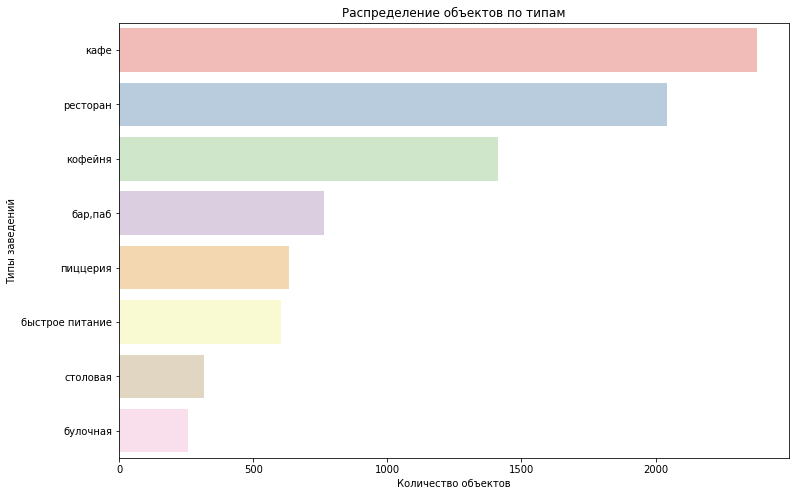

In [23]:
object_type = data.groupby('category')['name'].count().sort_values(ascending=False).reset_index()

plt.figure(figsize=(12, 8))
sns.barplot(x='name', y='category', data=object_type, palette='Pastel1')
plt.title('Распределение объектов по типам')
plt.xlabel('Количество объектов')
plt.ylabel('Типы заведений')
plt.show()

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Хорошим тоном считается показывать значения на графиках. 
    
Кстати это можно сделать с помощью:
    
- в бибилотеке `plotly` с помощью атрибута `text`, например в методе `px.bar`
- в библиотеке `matplotlib` <a href="https://queirozf.com/entries/add-labels-and-text-to-matplotlib-plots-annotation-examples">первый пример</a>, <a href="https://matplotlib.org/stable/gallery/lines_bars_and_markers/barchart.html">второй пример</a> для группированных графиков
    
</div>

По типу заведений, представленных в датасете, лидируют кафе и рестораны - каждого из этих типов насчитывается более, чем 2000 объектов. Кофейни - на третьем месте.

#### Количество посадочных мест в заведениях

In [24]:
data.seats.describe(percentiles=[0.05, 1/4, 1/2, 3/4, 0.95, 0.99])

count    4794.000000
mean      108.405090
std       122.840831
min         0.000000
5%          6.000000
25%        40.000000
50%        75.000000
75%       140.000000
95%       307.000000
99%       625.000000
max      1288.000000
Name: seats, dtype: float64

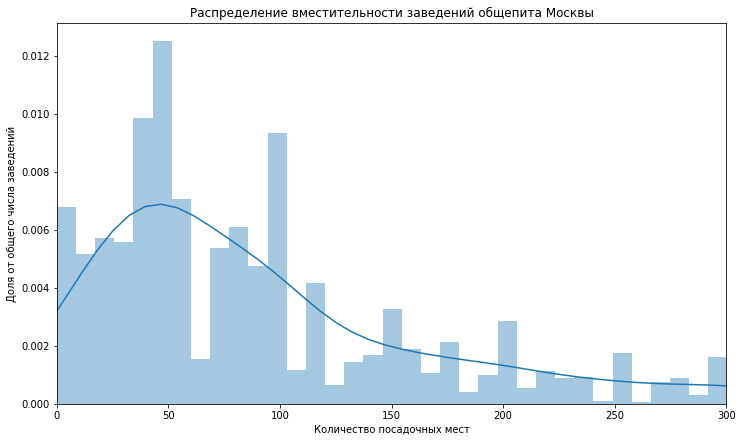

In [25]:
#data['seats'].hist(bins = 50, range = [0,300], figsize = (12,8))
plt.figure(figsize=(12, 7))
plt.xlim(0,300)
sns.distplot(data['seats'], bins = 150)
plt.xlabel('Количество посадочных мест')
plt.ylabel('Доля от общего числа заведений')
plt.title('Распределение вместительности заведений общепита Москвы')
plt.show()

<div class="alert alert-block alert-danger">✍
    

__Комментарий от тимлида №1__

График по данным построен корректно, но не оформлен до конца. Суть в том, что график должен быть наглядным без контекста (т.к. в реальной практике ты будешь показывать презентации или отчет сторонним людям). 

Тебе необходимо проследить чтобы всегда был заголовок и подписаны оси. Доработай этот момент пожалуйста.
    
Данное замечания относится ко всему проекту и перепроверь его самостоятельно. Далее не буду акцентировать на этом внимание
</div>

<div class="alert alert-info"> <b>Комментарии студента:</b> Заменил гистограмму на distplot, добавил подписи к осям и название графика.</div>

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №2__

Супер, старайся, пожалуйста, придерживаться этой стратегии в дальнейших проектах =)
</div>

На гистограмме заметны пики в районе "круглых" значений - 50, 100, 150, 200 итд. Заметна тенденция указывать количество посадочных мест приблизительно, округляя их в большую или меньшую сторону. Вероятно, данные предоставлены владельцами заведений и не уточнялись.

In [26]:
data_seats = data.pivot_table(index='category', values='seats', aggfunc=['mean', 'median']).reset_index()
data_seats

,category,mean,median
,,seats,seats
0,"бар,паб",124.532051,82.5
1,булочная,89.385135,50.0
2,быстрое питание,98.891117,65.0
3,кафе,97.512315,60.0
4,кофейня,111.199734,80.0
5,пиццерия,94.496487,55.0
6,ресторан,121.892041,86.0
7,столовая,99.750000,75.5


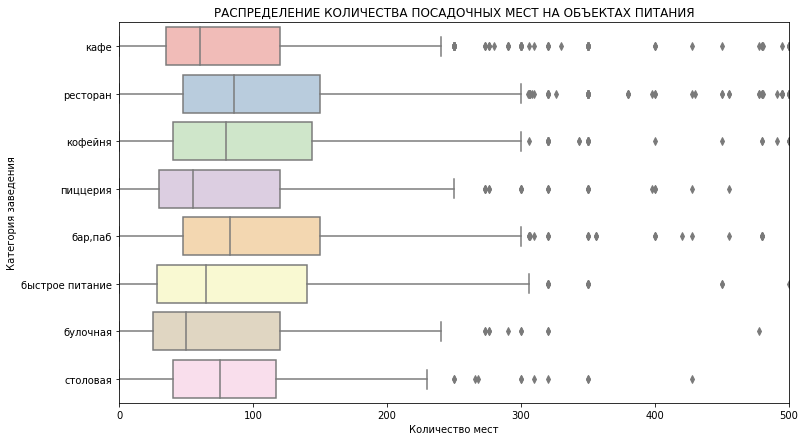

In [27]:
plt.figure(figsize=(12, 7))
sns.boxplot(x='seats', y='category', data=data, palette='Pastel1')
plt.xlim(0,500)
plt.title('РАСПРЕДЕЛЕНИЕ КОЛИЧЕСТВА ПОСАДОЧНЫХ МЕСТ НА ОБЪЕКТАХ ПИТАНИЯ')
plt.xlabel('Количество мест')
plt.ylabel('Категория заведения') 

plt.show()

Можно сделать вывод, что у большинства заведении число посадочных мест - от 50 до 150 и только в единичных случаях бывает более 300. По количесвту посадочных мест в лидерах бары и рестораны. В аутсайдерах - булочные.

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Да, больше всего посадочных мест у ресторанов, а меньше у булочных. Что вполне закономерно
</div>

#### Сетевые/Несетевые

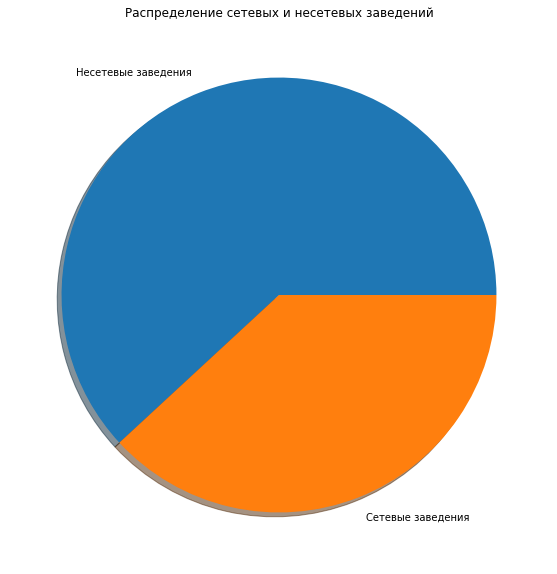

In [28]:
chain_group = data.groupby('chain')['name'].count().sort_values(ascending=False).reset_index()
#Заменим значения для лучшего отображения на диаграмме
chain_group.loc[0, 'chain'] = "Несетевые заведения"
chain_group.loc[1, 'chain'] = "Сетевые заведения"

# Построим pie chart
plt.figure(figsize = (10, 10))
plt.pie(chain_group.name, labels=chain_group.chain, shadow = True)
plt.title('Распределение сетевых и несетевых заведений')
plt.show()

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Не сетевых заведений, как и ожидалось больше
</div>

In [29]:
# самые большие сети
top_chain = data.query('chain == 1').pivot_table(index='name', values='chain', aggfunc ='count').reset_index()
top_chain = top_chain.sort_values(by = 'chain', ascending = False).head(15)
top_chain

,name,chain
729,шоколадница,120
335,домино'с пицца,76
331,додо пицца,74
146,one price coffee,71
742,яндекс лавка,69
58,cofix,65
168,prime,50
664,хинкальная,44
409,кофепорт,42
418,кулинарная лавка братьев караваевых,39


Text(0, 0.5, 'Количество точек')

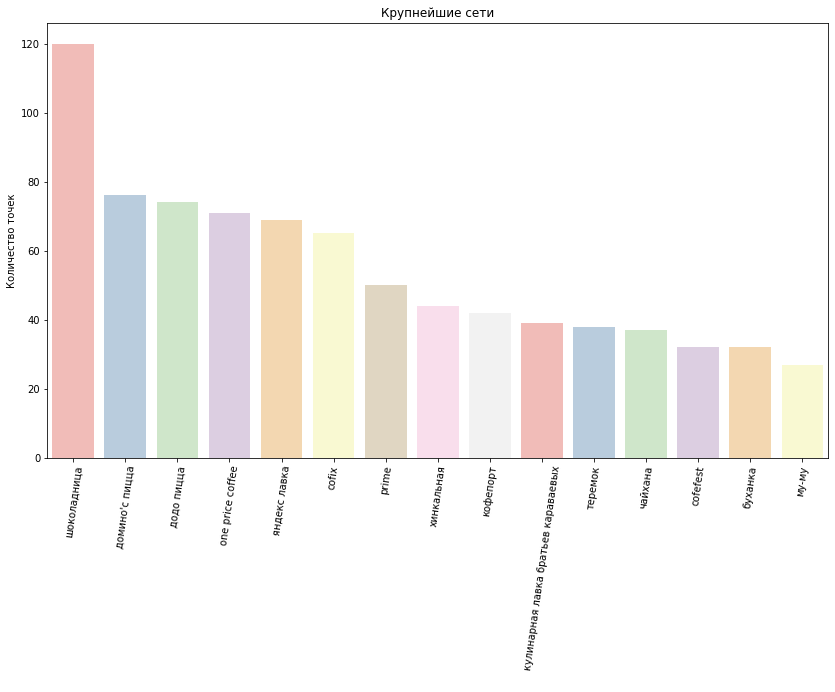

In [30]:
plt.figure(figsize=(14, 8))
sns.barplot(x='name', y='chain', data=top_chain, palette='Pastel1')
plt.title('Крупнейшие сети')
plt.xlabel(" ")
plt.xticks(rotation=82)
plt.ylabel('Количество точек') 

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Здорово, что не забыл при группировке отфильтровать по chain
</div>

In [31]:
chain_type = data.pivot_table(index = 'category', values='name', columns = 'chain', aggfunc='count').reset_index()
chain_type.set_axis(['category', 'no_chain', 'chained'], axis='columns', inplace=True)
chain_type['total'] = chain_type['no_chain'] + chain_type['chained']
chain_type = chain_type.sort_values(by='total', ascending = False)
display(chain_type)

,category,no_chain,chained,total
3,кафе,1599,779,2378
6,ресторан,1313,729,2042
4,кофейня,693,720,1413
0,"бар,паб",596,169,765
5,пиццерия,303,330,633
2,быстрое питание,371,232,603
7,столовая,227,88,315
1,булочная,99,157,256


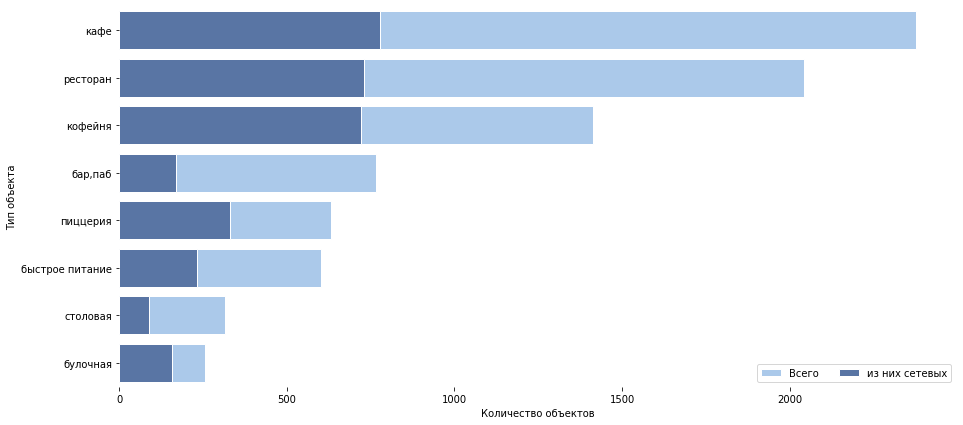

In [32]:
f, ax = plt.subplots(figsize = (15,7))

sns.set_color_codes('pastel')
sns.barplot(x = 'total', y = 'category', data = chain_type,
            label = 'Всего', color = 'b', edgecolor = 'w')

sns.set_color_codes('deep')
sns.barplot(x = 'chained', y = 'category', data = chain_type,
            label = 'из них сетевых', color = 'b', edgecolor = 'w')
ax.legend(ncol = 2, loc = 'lower right')
ax.set(ylabel="Тип объекта", xlabel="Количество объектов")
sns.despine(left = True, bottom = True)
plt.show()

Сетевых заведений в датасете около 40 процентов. Крупнейшая сеть - Шоколадница. Следом идут две конкурирующие сети пиццерий (додо и доминос) и две конкурирующие сети кофеен (кофикс и onepricecoffee). Яндекс лавка тоже среди лидеров.

В целом - принадлежность к сети - типичная история для булочных, пиццерий и кофеен. Среди несетевых объектов лидируют по относительным показателям впереди бары и столовые.

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Верно, булочная и пиццерия в ТОП по кол-ву сетевых заведений
</div>

#### Средний рейтинг 

In [33]:
rating_data = pd.DataFrame(data.groupby('category')['rating'].mean()).reset_index().sort_values(by='rating')
rating_data

,category,rating
2,быстрое питание,4.050249
3,кафе,4.123886
7,столовая,4.211429
1,булочная,4.268359
4,кофейня,4.277282
6,ресторан,4.290402
5,пиццерия,4.301264
0,"бар,паб",4.387712


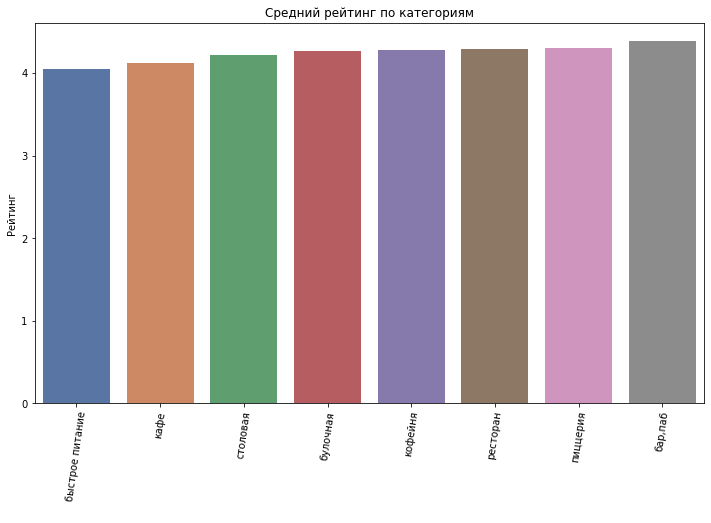

In [34]:
plt.figure(figsize=(12, 7))
sns.barplot(x='category', y='rating', data=rating_data, palette='deep')
plt.title('Средний рейтинг по категориям')
plt.xlabel(" ")
plt.xticks(rotation=82)
plt.ylabel('Рейтинг') 
plt.show()

Мы видим, что серьезного разброса в рейтинге в зависимости от типа заведения нет. У всех средний рейтинг чуть выше 4 баллов. Ниже всех фаст-фуд, а в лидерах - бары. Возможно, тут есть психологический эффект - в бары приходят люди за отдыхом - соответственно они более щедры на высокие оценки.

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Верно,  брать медиану по фиксированным значениями от 1 до 5 - нецелесообразно.
</div>

#### Анализ заведений по административным районам

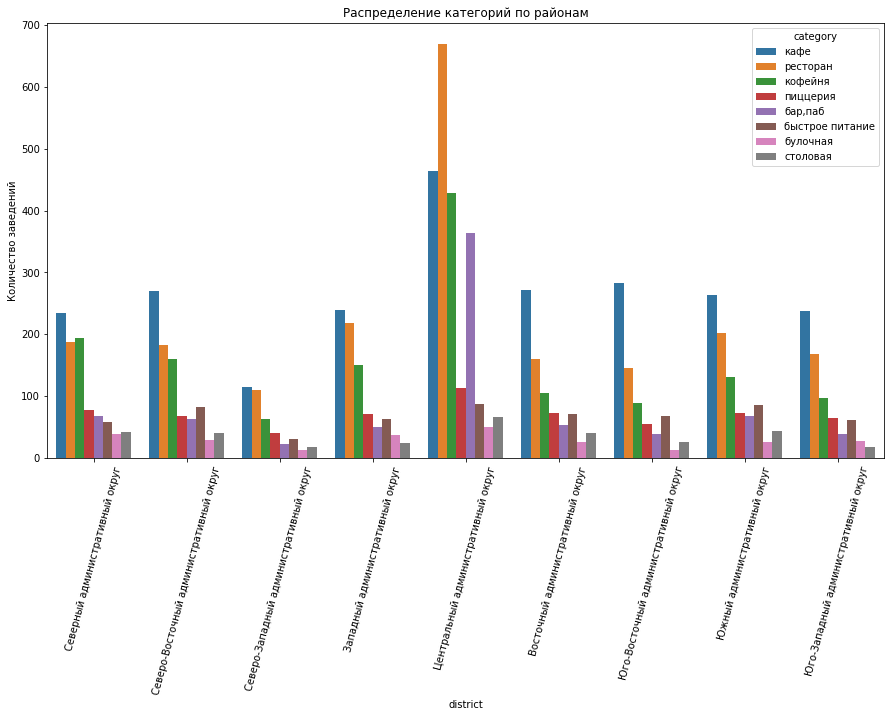

In [35]:
plt.figure(figsize=(15, 8))
sns.countplot(x='district', hue='category', data=data)
plt.xticks(rotation=75)
plt.title('Распределение категорий по районам')
plt.ylabel('Количество заведений') 
plt.show()

Подавляющее число заведений находится в ЦАО. Меньше всего - в СЗАО. По остальных районам распределение примено одинаковое. Особенно заметно преимущество ЦАО в каличестве баров (в 7-8 раз больше, чем в других районах) и ресторанов (в 3-4 больше).
Можно предположить, что средний рейтинг в ЦАО, будет выше, чем в других районах из-за того, что именно у этих категорий чаще всего высокой рейтинг.

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Согласен, результат ожидаемый ЦАО в лидерах
</div>

Посчитаем распеределение среднего рейтинга по административным районам.

In [36]:
rating_district = data.groupby('district', as_index=False)['rating'].agg('mean').round(3)
rating_district

,district,rating
0,Восточный административный округ,4.174
1,Западный административный округ,4.182
2,Северный административный округ,4.240
3,Северо-Восточный административный округ,4.148
4,Северо-Западный административный округ,4.209
5,Центральный административный округ,4.378
6,Юго-Восточный административный округ,4.101
7,Юго-Западный административный округ,4.173
8,Южный административный округ,4.184


In [37]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)
    
state_geo = '/datasets/admin_level_geomap.geojson'

# создаём карту Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='OrRd',
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий средний рейтинг в ЦАО. Это связано с большим относительным числом высокорейтинговых типов заведений - баров и ресторанов.

#### Заведения на карте

In [38]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Отлично, хороплет освоен
</div>

#### Анализ улиц

In [39]:
streets = data['street'].value_counts().reset_index().head(15)
streets.columns = ['street_name', 'count']
top_streets = streets['street_name']
streets

,street_name,count
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


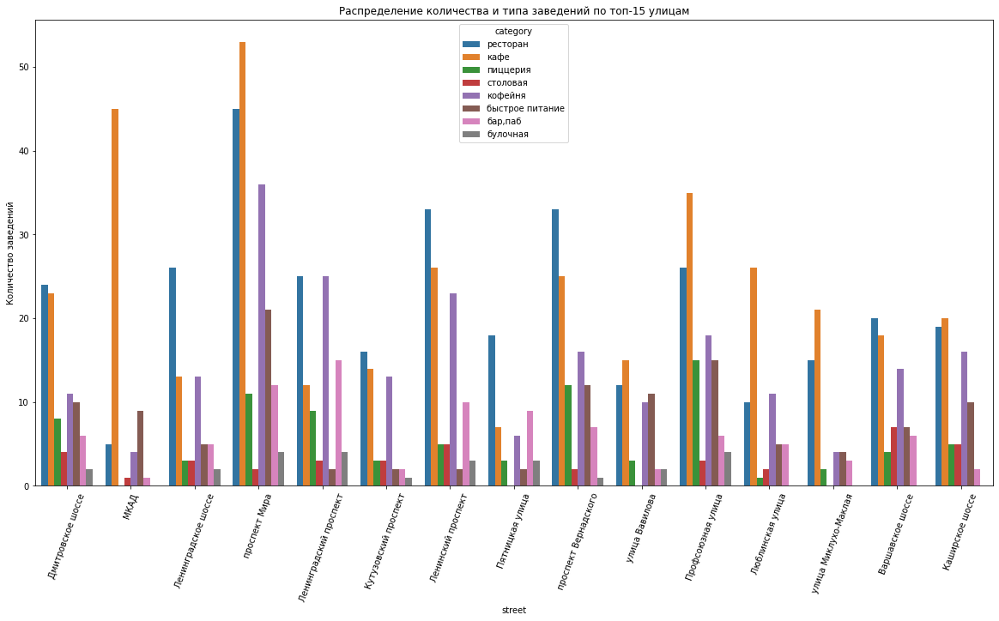

In [40]:
top_street_data = data.query('street in @top_streets')
plt.figure(figsize=(20, 10))
sns.countplot(x='street', hue='category', data=top_street_data)
plt.xticks(rotation=70)
plt.ylabel('Количество заведений') 
plt.title('Распределение количества и типа заведений по топ-15 улицам')
plt.show()

По количеству заведений в яных лидерах - Проспект Мира. Лично для меня, как для москвича, ситуация достаточно странная. Я не рассатриваю Проспект Мира как метсо, которое ассоциируется с ресторанами. В голову приходят скорее Пятницкая улица и Кузнецкий Мост. Хотя, скорее всего "секрет" Проспекта Мира в его протяженности. Если посмотреть на вывод топ-15 улиц, то в списке окажутся сразу несколько шоссе и проспектов.

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Согласен с полученными результатами, что не удивительно, ведь проспект Мира одна из самых больших и популярных улиц столицы
</div>

In [41]:
forever_alone = data['street'].value_counts().reset_index()
forever_alone.columns = ['street_name', 'cafe_count']
forever_alone = forever_alone[forever_alone['cafe_count'] == 1]
forever_alone

,street_name,cafe_count
990,Пушкарёв переулок,1
991,2-я Пугачёвская улица,1
992,улица Розанова,1
993,Крылатский мост,1
994,Сумской проезд,1
...,...,...
1443,проезд Донелайтиса,1
1444,Зарайская улица,1
1445,Ордынский тупик,1
1446,Композиторская улица,1


В данном списке 458 улиц, на которых находится только 1 заведение общественного питания.

#### Средний чек на карте

Проверим, все ли нормально со столбцом

In [42]:
data['middle_avg_bill']

0          NaN
1       1550.0
2       1000.0
3          NaN
4        500.0
         ...  
8401       NaN
8402       NaN
8403     150.0
8404       NaN
8405       NaN
Name: middle_avg_bill, Length: 8405, dtype: float64

In [43]:
display (data['middle_avg_bill'].value_counts(), data['middle_avg_bill'].describe())

1250.0    247
1000.0    175
300.0     148
1500.0    146
400.0     134
         ... 
545.0       1
6000.0      1
345.0       1
1060.0      1
30.0        1
Name: middle_avg_bill, Length: 230, dtype: int64

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

In [44]:
bill_df = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
bill_df

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [45]:
map_new = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='OrRd',
    legend_name='Средний чек заведений по районам',
).add_to(map_new)

map_new

В лидерах по среднему чеку - центр и запад Москвы. в аутсайдерах - СВАО, ЮАО и ЮВАО. Это подтверждает типичные московские стереотипы о распределении доходов по районам. Можно считать данные релевантными.

<div class="alert alert-block alert-danger">✍
    

__Комментарий от ревьюера №1__
Соберите наблюдения по вопросам выше в один общий вывод.

<div class="alert alert-info"> <b>Комментарии студента:</b> Вывод добавлен ниже

**Вывод**

Нами проведен анализ данных данного датасета. Проанализированы распределение количества посадочных мест, категории заведений, показатели их среднего чека и среднего рейтинга и распределение заведений на карте Москвы.

По многим показателям выделяется центр Москвы - здесь больше всего заведений, веше всего их рейтинг и средний.

По количеству посадочных мест ожидаемо лидирует бары и рестораны. Меньше всего вместимость у булочных и пиццерий.

38.1 процент - сетевые заведения. Доля сетевых выше у булочных, пиццерий и кофеен, меньше - у баров.

Средний рейтинг заведений - в диапазоне от 4 звезд у фаст-фуда до 4.3 у баров.

По показателю среднего чека лидирует не только центр, но и Западный Административный Округ.

Чем длиннее улица, тем больше на ней заведений. В Москве 458 улиц, где находится только одно заведение общепита.

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №2__

Средний чек центрального округа самый высокий, что не удивительно. Не сильно по цене уступает и Западный округ. Бюджетные заведения легче встретить ЮАО, ЮВАО и СВАО.
</div>

### Окрытие кофейни

In [46]:
# Здесь и далее назвал переменную cafe, хотя лучше было выбрать другое имя, чтобы не путать кафе и кофейни.
cafe = data[data['category'] == 'кофейня']
not_cafe = data[data['category'] != 'кофейня']
cafe_sorted = cafe.groupby('district', as_index=False)['name'].agg('count').sort_values(by = 'name', ascending = False)
cafe_sorted

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


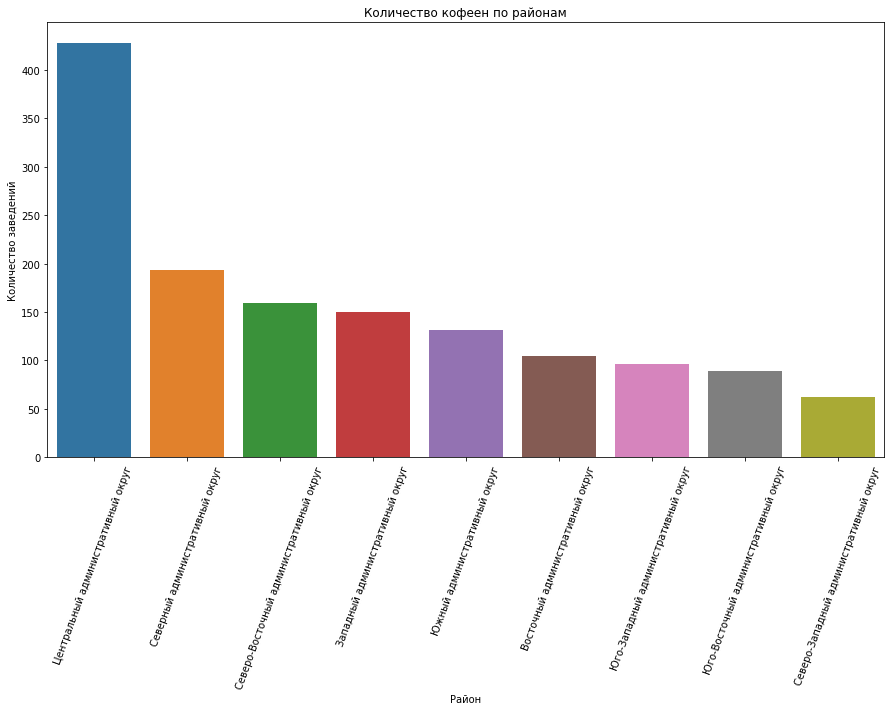

In [47]:
plt.figure(figsize=(15, 8))
sns.barplot(x='district', y= 'name', data=cafe_sorted) 
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.title('Количество кофеен по районам')
plt.xticks(rotation=70)
plt.show()

<div class="alert alert-block alert-danger">✍
    

__Комментарий от ревьюера №1__

Отсутствует сортировка графика. Поправь, пожалуйста

<div class="alert alert-info"> <b>Комментарии студента:</b> Сортировка добавлена. Создана новая таблица с сортировкой. Вместо countplot() использован barplot()

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №2__

Спасибо за правку)
</div>

In [48]:
cafe_table = cafe['district'].value_counts().reset_index()
cafe_table.rename({'index': 'district', 'district': 'cafe_count'}, axis=1, inplace=True)
cafe_table

,district,cafe_count
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [49]:
map_cafe = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=cafe_table,
    columns=['district', 'cafe_count'],
    key_on='feature.name',
    fill_color='OrRd',
    legend_name='Количество кофеен по районам',
).add_to(map_cafe)

map_cafe

Подавляющее число кафе - в ЦАО. Разделим датасет на две части по принципу - находится ли кафе в центре или нет. И выведем ключевые показатели, такие как средний рейнтинг, стоимость чашки кофе и средний чек.

In [50]:
cafe_central = cafe[cafe['district'] == 'Центральный административный округ']
cafe_rural = cafe[cafe['district'] != 'Центральный административный округ']
print('Средний рейтинг для всех заведений, кроме кофейни', not_cafe['rating'].mean())
print('Срений рейтинг для кофейни в центре', cafe_central['rating'].mean())
print('Средний рейтинг для кофейни не в центре', cafe_rural['rating'].mean())
print('Срений чек для кофейни в центре', cafe_central['middle_avg_bill'].mean())
print('Срений чек для кофейни не в центре', cafe_rural['middle_avg_bill'].mean())
print('Средняя стоимость чашки кофе в кофейне в центре', cafe_central['middle_coffee_cup'].mean())
print('Средняя стоимость чашки кофе в кофейне не в центре', cafe_rural['middle_coffee_cup'].mean())

Средний рейтинг для всех заведений, кроме кофейни 4.220323226544623
Срений рейтинг для кофейни в центре 4.336448598130841
Средний рейтинг для кофейни не в центре 4.251573604060914
Срений чек для кофейни в центре 794.7647058823529
Срений чек для кофейни не в центре 480.75652173913045
Средняя стоимость чашки кофе в кофейне в центре 187.5185185185185
Средняя стоимость чашки кофе в кофейне не в центре 169.4317548746518


In [51]:
cafe['street'].value_counts().head(15)

проспект Мира             36
Ленинградский проспект    25
Ленинский проспект        23
Профсоюзная улица         18
Каширское шоссе           16
проспект Вернадского      16
Варшавское шоссе          14
Кутузовский проспект      13
Новослободская улица      13
Ленинградское шоссе       13
Новодмитровская улица     12
Люблинская улица          11
Дмитровское шоссе         11
улица Вавилова            10
Алтуфьевское шоссе         9
Name: street, dtype: int64

Из распределния кафе по улицам нельзя сделать никакого вывода, кроме того, что чем длиннее улица - тем больше на ней кафе.

In [52]:
cafe['is_24/7'].value_counts()

False    1354
True       59
Name: is_24/7, dtype: int64

In [53]:
#Заодно посмотрим, какова в принципе доля круглосуточных заведений по всему датасету
data['is_24/7'].value_counts()

False    7675
True      730
Name: is_24/7, dtype: int64

In [54]:
cafe_central['is_24/7'].value_counts()

False    402
True      26
Name: is_24/7, dtype: int64

<AxesSubplot:>

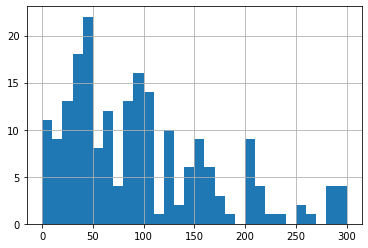

In [55]:
cafe_central['seats'].hist(range = [0,300], bins = 30)

По количеству мест картина схожая с основным датафреймом. Больше всего заведений в диапазоне 50-100, преобладают круглые числа.

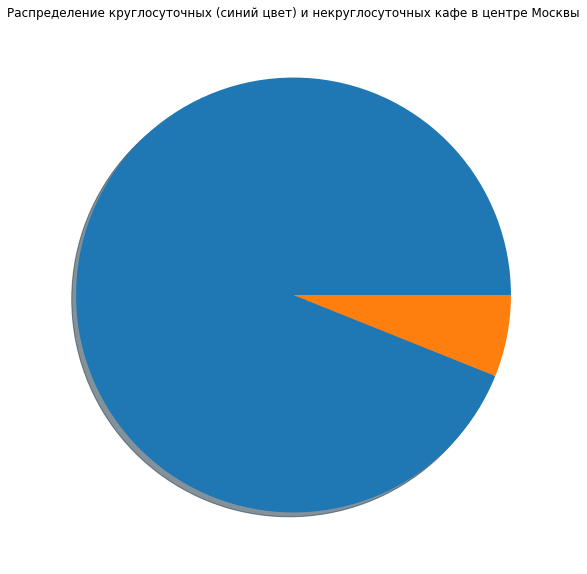

In [56]:
plt.figure(figsize = (10, 10))
plt.pie(cafe_central['is_24/7'].value_counts(), shadow = True)
plt.title('Распределение круглосуточных (синий цвет) и некруглосуточных кафе в центре Москвы')
plt.show()

<div class="alert alert-block alert-danger">✍
    

__Комментарий от ревьюера №1__
На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

<div class="alert alert-info"> <b>Комментарии студента:</b> Мне кажется, я упомянул это в выводе ниже
    
Моя рекомендация - цена чашки капучино в диапазоне 180-200 рублей, не превышая психологический барьер в 200 рублей. Это соответствует средней цене за капучино по району ЦАО в 187 рублей.
</div>

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №2__

Увидел. Спасибо, что подсветил

Вывод - круглосуточные кофейни - это, скорее, экзотика, чем норма. С точки зрения обывательской логики, люди предпочитают ходить в кофейни днем(по утрам и в обеденный перерыв), а в бары и рестораны - вечером и по ночам. Хотя, вероятно, персонажи сериала "Друзья" мыслили в другом русле.

Основной вывод - принять решение об инвестировании можно только лишь зная данные об окупаемости бизнеса. В нашем датасете не хватает ключевых метрик для анализа ROI. Для анализа окупаемости необходимы данные о затратах на помещение и персонал (средняя стоимость аренды, площадь, количество персонала и  его средняя з/п). Также необходимы данные о потенциальной прибыли, ведь нельзя сделать вывод о прибыльности заведения, только исходя из его рейтинга, среднего чека и стоимости чашки кофе.

Исходя из моего исследования, я бы рекомендовал потенциальным инвесторам выделить несколько ключевых показателей, которые они могли бы учесть, проводя более глубокий анализ на предмет ROI:

Район - ЦАО

Некруглосуточное

Количество посадочных мест - 50-100

Ожидаемый средний чек - 790р

Средняя стоимость чашки кофе - 190р (среднее значение по кофейням в центре 187 рублей. Не следует пробивать психологический барьер в 200р)

Ожидаемый средний рейтинг - 4.3

В целом, наличие значительного количества несетевых кофеен в ЦАО может говорить о том, что желание открыть кофейню - вполне жизнеспособная идея. Вероятнее всего, ключевую роль играет выбор локации с наибольшей проходимостью, что необходимо учесть при выборе места для потенциальной кофейни.

**Общий вывод**

Предлагаемый к анализу датасет позволяет произвести общеее знакомство с рынком общественного питания, но ему критически не хватает данных, для того, чтобы сделать выводы об инвестициях.

После анализа данных, удалось установить, что:

Больше половины заведений в датасете - кафе и рестораны, на долю оставшихся заведений приходится только около 48 процентов от общего числа.

Примерно 40 процентов заведений - сетевые. Наиболее популярная сеть - с большим отрывом "Шоколадница". Сетевыми чаще всего бывают кофейни, булочные и пиццерии. Меньше всего сетевых баров и ресторанов.

Средний рейтинг заведений чуть выше 4 звезд. Меньше всего звезд получают заведения фаст-фуда, больше всего - бары и пабы.

Больше всего заведений сосредоточены в центре Москвы. Также в центре самый большой средний чек и самый высокий рейтинг.

Доля круглосуточных заведений от общего числа - небольшая и составляет 8.68 процента. Если говорить исключительно о кофейнях, то цифра еще ниже и составляет 4.17% от общего числа кофеен. Примерно половина из общего числа круглосуточных кофеен (26 из 59) находится в ЦАО.

Количество посадочных мест колеблется в широком диапазоне В датасете представлены как заведения с минимальным количеством мест, так и вмещающие более 600 человек. Стандартным значением является 50-100 мест. Чаще всего указано "круглое" число место (50, 100, 125 итп.)

Исследование улиц выявило, что больше всего заведений в абсолютном выражении приходится на проспекты и шоссе - в виду их длины.

На 458 улицах пристутствует только заведение общепита.

Средний чек в центре и на западе Москвы почти в два раза больше, чем во всех остальных районах.

Составлена презентация для того, чтобы представить результаты исследования заказчику.

Рекоммендация заказчику
**Не стоит отказываться от идеи открытия новой кофейни. Как видно из моего исследования, в Москве достаточно большое число успешно функционирующих кафе. Их примерные характеристики я привожу в последнем слайде моей презентации. Для того, что открытие кафе было успешным, а инвестиции окупились, рекоммендую провести дополнительное исследование на предмет ROI, учитывая анализ факторов, перечисленных мной в выводе по 3 разделу, а также отдельно описаных мной в презентации**

Ссылка на презентацию:<https://disk.yandex.ru/i/oNvrDQxDs6d_Cw>

**Ссылка на обновленную презентацию:** <https://disk.yandex.ru/i/0WTjgFq1lKTzsQ>

<div class="alert alert-block alert-warning">📝
    

__Комментарий от ревьюера №1__
Итоговый вывод завершает твое исследование. Представлены основные результаты полученные в ходе анализа, но самое главное - даны рекомендации заказчику. Это важное качество для аналитика. Развивай его и дальше
    
    
---
    
Не забудь, пожалуйста, подкорретировать вывод после правок
</div>

<div class="alert alert-block alert-warning">📝
Комментарий от ревьюера №1 </b> 

---
У тебя получилась очень сильная и хорошая работа. Здорово, что расчеты ты сопровождаешь иллюстрациями, а так же не забываешь про комментарии, твой проект интересно проверять. 

---

***Нужно поправить:***

1) Неявные дубликаты

2) Оформление графиков

3) Выводы по разделам

4) На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

5) Поправить выводы и презентацию после корректировки


---


***Презентация сделана хорошо, особенно порадовало:***

* её структурность

* Один слайд-одна мысль. Идеально =) 😊 

* последовательность

* общий вывод

* рекомендации

***Как её нужно улучшить:***



* Нумерация слайдов


Давай поправим мои основные комментарии и будем двигаться дальше.

---

У Яндекс Практикума есть отличный и бесплатный курс по презентациям. Советую, в свободное время освоить его (https://practicum.yandex.ru/profile/visual-presentation/)


---


Если у тебя будут какие-то вопросы по моим комментариям - обязательно пиши! Буду ждать работу на повторное ревью :)</div>

<div class="alert alert-info"> <b>Комментарии студента:</b> Чек-лист исправления критических замечаний

 1) Неявные дубликаты -- добавил раздел, где изучил проблему неявных дубликатов

2) Оформление графиков - Переработан вывод двух графиков - в разделе 2.2 и в разделе 3. В нескольких местах добавлены подписи к осям.

3) Выводы по разделам - Написан общий вывод по второму разделу

4) На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?  - Дан комментарий и разъяснение по цене

5) Поправить выводы и презентацию после корректировки  - В общий вывод добавлена рекомендация заказчику (выделена полужирным). В презентацию добавлена нумерация. Удален пустой слайд в конце презентации.
    
Некритические замечания будут учтены мной при выполнении следующих проектов. Спасибо за комментарии и ссылки на обучающие материалы!
    
</div>

<div style="border:solid blue 3px; padding: 20px">
<div class="alert alert-block alert-success">✔️
    

__Коментарий от ревьюера №2__

    
В остальном всё чудно😊. Твой проект так и просится на github =)   
    
Поздравляю с успешным завершением проекта 😊👍
И желаю успехов в новых работах 😊

---

От себя хочу порекомендовать тебе отличный метериал про визуализации данных. 
    
* **Книга Графики, которые убеждают всех | А. Богачев**
    
* **Курс по созданию презентаций для специалистов цифровых профессий (free): https://practicum.yandex.ru/visual-presentation/**
    